**Author: Svenja Gaedcke**  
gaedcke.svenja@mh-hannover.de  
06.12.2021  

# Setup

In [1]:
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb

#Read config file
import configparser as config
config = config.ConfigParser()
config.read('./config.ini')
#os.chdir(config['PATHS']["OUTPUT"])

sc.settings.verbosity = 0       
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100)
sc.settings.figdir = config['PATHS']["OUTPUT"]+"/figs/"
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150,
                         frameon=True, vector_friendly=True, 
                         fontsize=14, color_map=None, format='pdf',
                         transparent=True )
sc._settings.savefigs = False

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.21.5 scipy==1.7.3 pandas==1.1.2 scikit-learn==1.0.2 statsmodels==0.12.0 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.7.0


# PT cells

In [2]:
adata_pt = sc.read(config['PATHS']["OUTPUT"]+"/sn_pt.h5ad")
adata_pt

AnnData object with n_obs × n_vars = 8853 × 19271
    obs: 'sample', 'sample_description', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'percent_mito', 'predicted_doublets', 'doublet_scores', 'louvain', 'n_counts_log', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'celltype_colors', "dendrogram_['louvain']", 'dendrogram_louvain', 'louvain', 'louvain_colors', 'neighbors', 'neighbors_harmony', 'pca', 'rank_genes_groups', 'sample_colors', 'sample_description_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'neighbors_harmon

In [3]:
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].str.replace("nuclei_","")
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].astype('category')
adata_pt.obs["sample_description"] = adata_pt.obs["sample_description"].cat.reorder_categories(['control','17min','27min'])

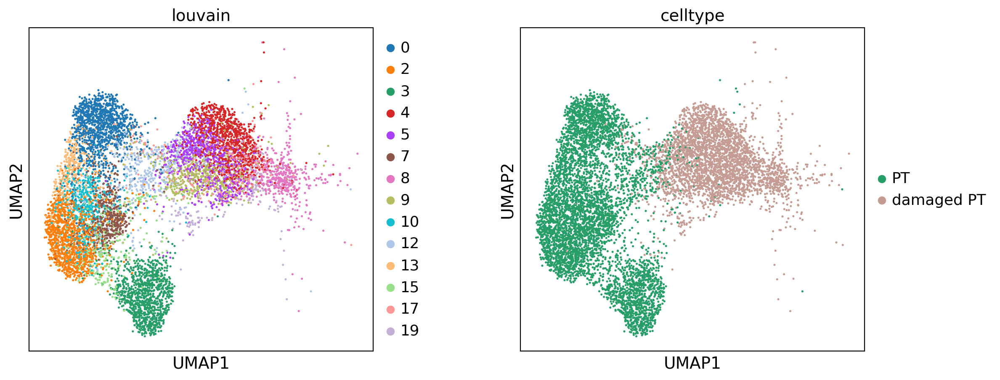

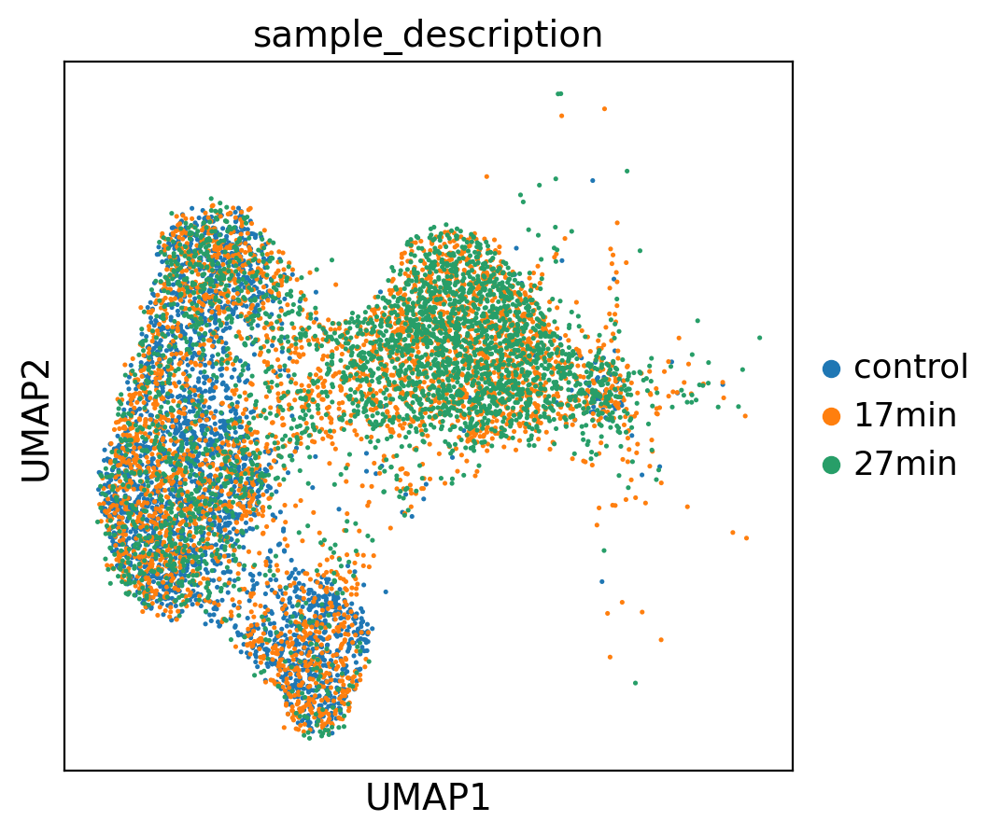

In [4]:
rcParams['figure.figsize'] = 5,5
del adata_pt.uns["louvain_colors"]
sc.pl.umap(adata_pt, color=['louvain',"celltype"], wspace=0.3)
sc.pl.umap(adata_pt, color=['sample_description'], wspace=0.3)#, save="_sn_pt_sample.pdf")

# Identify Markergenes

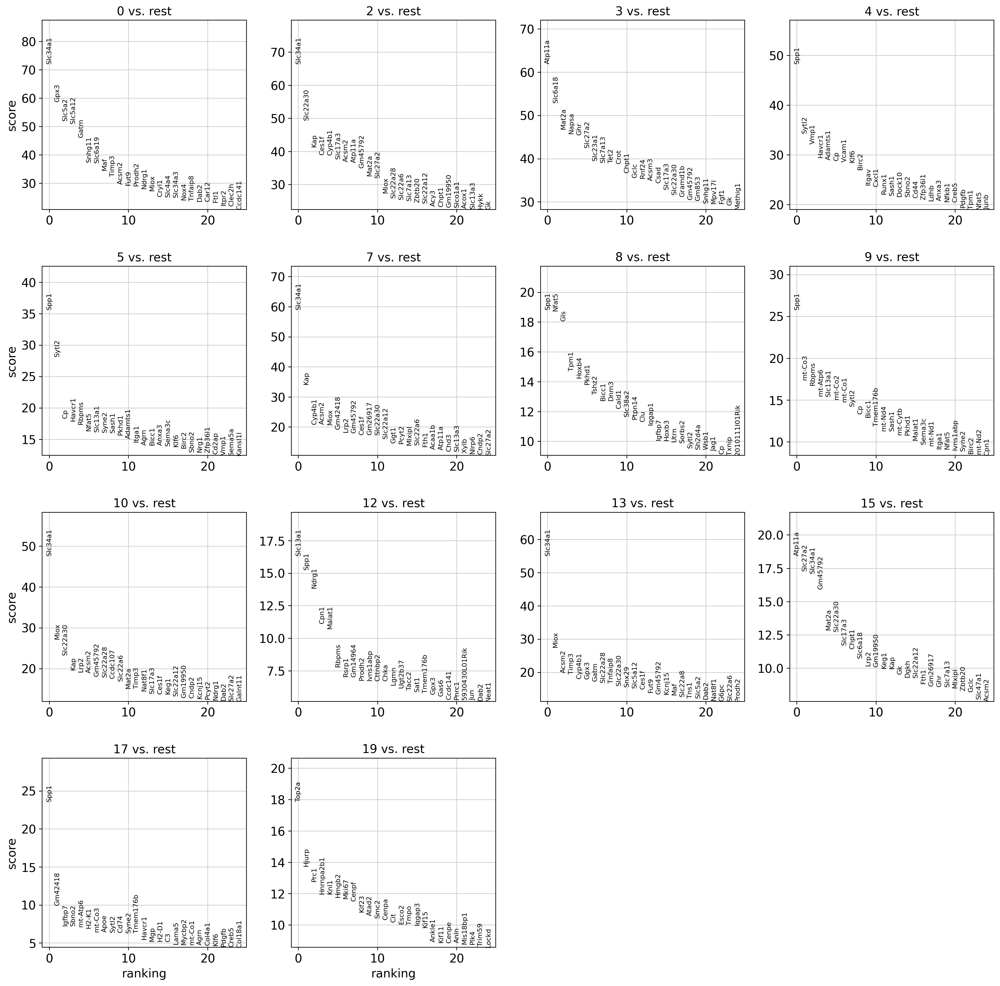

In [5]:
sc.tl.rank_genes_groups(adata_pt, 'louvain')
sc.pl.rank_genes_groups(adata_pt, n_genes=25, sharey=False)

# Identify Clusters (Kirita)
using Genes from Kirita, Yuhei, et al. "Cell profiling of mouse acute kidney injury reveals conserved cellular responses to injury." bioRxiv (2020).  
Supplements 2: GDE Table: CLuster - Gene   
Annotation of Cluster with Figure 2.A

In [6]:
import pandas as pd
kirita = pd.read_excel(config['PATHS']["DATA_KIRITA"]+"/pnas.2005477117.sd02.xlsx",
                       sheet_name= "MousePT_DEG")
print("before filtering logFC >0.584: ",kirita.shape)
kirita = kirita[kirita["avg_logFC"] >= 0.584] #FC > 1.5
print("after filtering logFC >0.584: ",kirita.shape)

before filtering logFC >0.584:  (3097, 8)
after filtering logFC >0.584:  (953, 8)


In [7]:
kirita_markers = kirita[["gene", "cluster"]]
kirita_markers.replace(1, "Healthy S1", inplace=True)
kirita_markers.replace(2, "Healthy S2", inplace=True)
kirita_markers.replace(3, "Healthy S3", inplace=True)
kirita_markers.replace(4, "Repairing PT", inplace=True)
kirita_markers.replace(5, "Injured S1/2", inplace=True)
kirita_markers.replace(6, "Injured S3", inplace=True)
kirita_markers.replace(7, "Severe Injured PT", inplace=True)
kirita_markers.replace(8, "Failed repair PT", inplace=True)
kirita_markers.drop_duplicates()
kirita_markers_dict = {}

for group in np.unique(kirita_markers.cluster):
    kirita_markers_dict[group] = set(kirita_markers[kirita_markers.cluster == group].gene)
del(kirita_markers)

{key: len(value) for key, value in kirita_markers_dict.items()}

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/pandas/core/frame.py:4384: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


{'Failed repair PT': 142,
 'Healthy S1': 81,
 'Healthy S2': 82,
 'Healthy S3': 195,
 'Injured S1/2': 67,
 'Injured S3': 150,
 'Repairing PT': 23,
 'Severe Injured PT': 213}

                      0     2     3     4     5     7     8     9    10   12  \
Failed repair PT    0.0   0.0   0.0  22.0  28.0   0.0  12.0  19.0   0.0  3.0   
Healthy S1         28.0   4.0   1.0   0.0   0.0   3.0   0.0   0.0   8.0  6.0   
Healthy S2          4.0  22.0   9.0   0.0   0.0  16.0   0.0   0.0  22.0  1.0   
Healthy S3          1.0  15.0  38.0   0.0   0.0   9.0   0.0   0.0  14.0  0.0   
Injured S1/2        1.0   0.0   1.0   4.0   3.0   1.0   1.0   1.0   1.0  6.0   
Injured S3          0.0   0.0   2.0  11.0   6.0   1.0   4.0   1.0   0.0  2.0   
Repairing PT        1.0   0.0   0.0   0.0   1.0   0.0   0.0   1.0   0.0  1.0   
Severe Injured PT   1.0   1.0   2.0   7.0   6.0   1.0   3.0   2.0   1.0  7.0   

                     13    15    17   19  
Failed repair PT    0.0   0.0  18.0  1.0  
Healthy S1         17.0   2.0   0.0  1.0  
Healthy S2         15.0  19.0   0.0  0.0  
Healthy S3          4.0  23.0   0.0  0.0  
Injured S1/2        0.0   2.0   4.0  0.0  
Injured S3          0

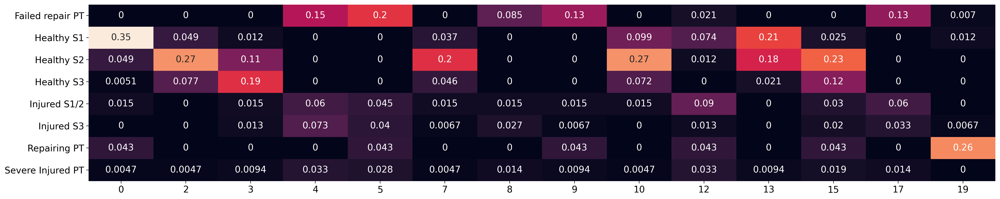

In [8]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
print(sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, top_n_markers = 50))
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
                                                 normalize='reference',top_n_markers = 50)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/"
#plt.savefig(fig_dic+"_sn_compasrion_clusters_kirita.png", dpi=400)

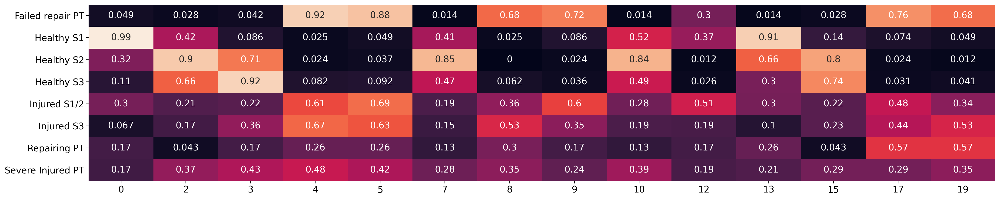

In [9]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
                                                 normalize='reference',adj_pval_threshold = 0.05)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/"
#plt.savefig(fig_dic+"_sn_compasrion_clusters_kirita_pval005.png", dpi=600)

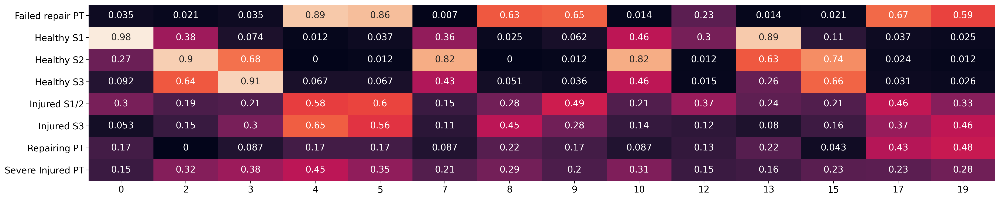

In [10]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
                                                 normalize='reference',adj_pval_threshold = 0.01)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/"
#plt.savefig(fig_dic+"_sn_compasrion_clusters_kirita_pval001.png", dpi=400)

# lable cells with categorie from PNA S Paper   

https://doi.org/10.1073/pnas.2005477117
Defining DGEs are available in supplemental Dataset S03

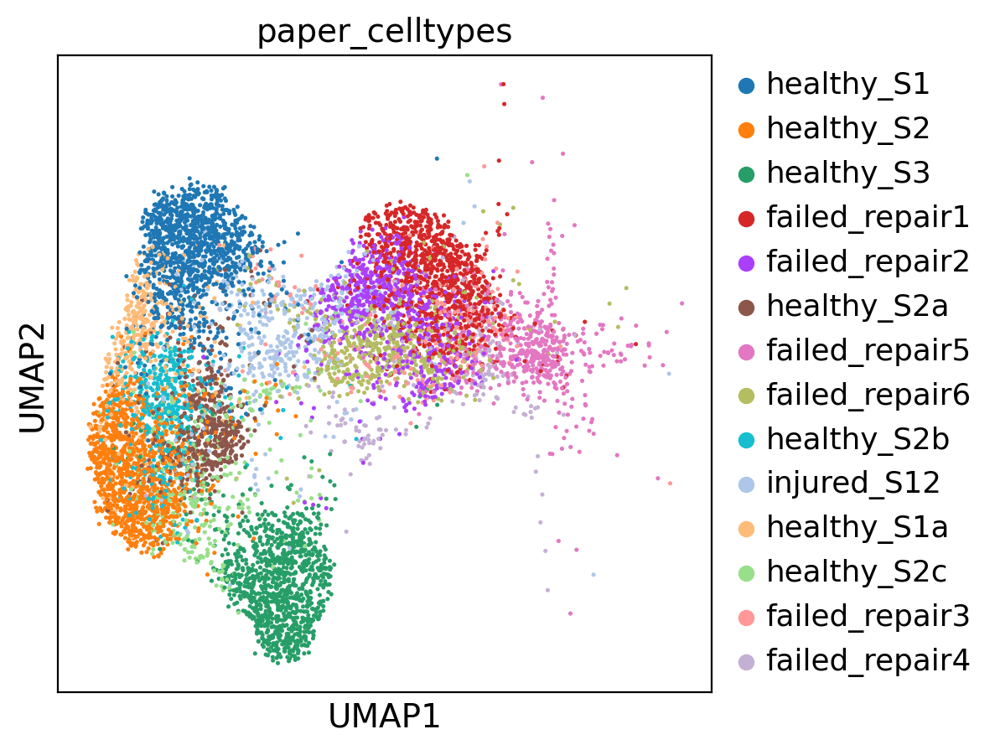

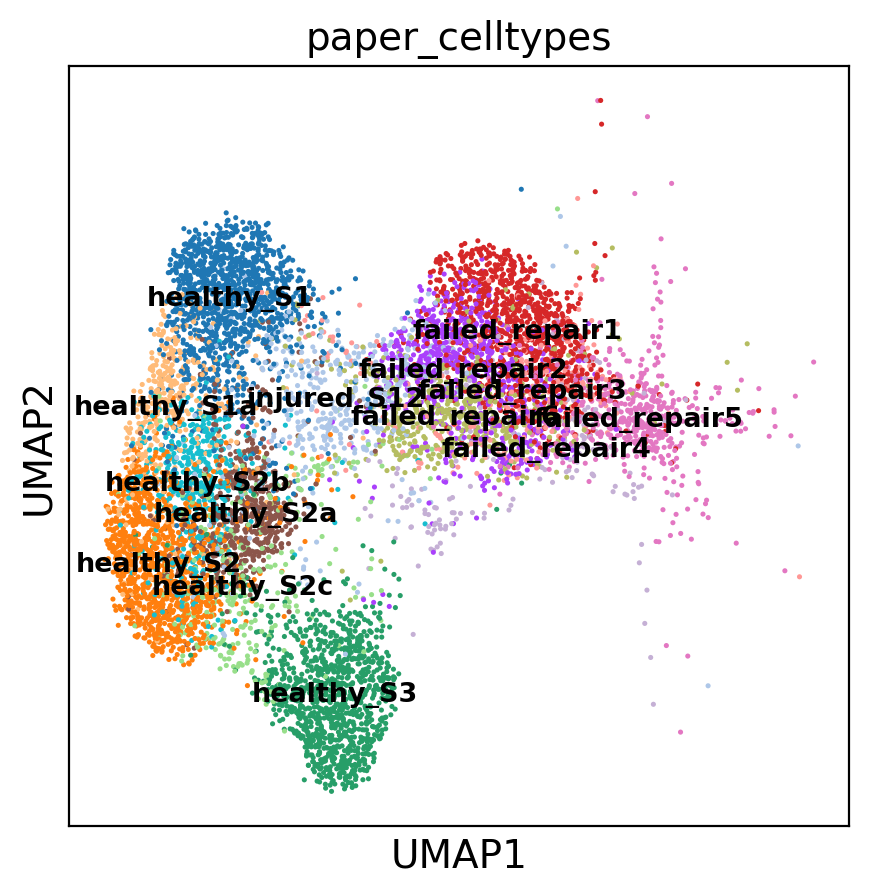

In [11]:
plt.rcParams['figure.figsize']=(5,5)
adata_pt.obs["paper_celltypes"] = adata_pt.obs.louvain
new_cluster_names = ["healthy_S1","healthy_S2", "healthy_S3", "failed_repair1",  "failed_repair2", 
                     "healthy_S2a", "failed_repair5", "failed_repair6", "healthy_S2b", 
                     "injured_S12", "healthy_S1a", "healthy_S2c", "failed_repair3", "failed_repair4"]
adata_pt.rename_categories('paper_celltypes', new_cluster_names)

sc.pl.umap(adata_pt, color="paper_celltypes")
sc.pl.umap(adata_pt, color="paper_celltypes", legend_loc="on data", legend_fontsize="x-small")

In [12]:
print("number of genes used to identify celltypes:")
kirita.groupby("cluster").count()["gene"]

number of genes used to identify celltypes:


cluster
1     81
2     82
3    195
4     23
5     67
6    150
7    213
8    142
Name: gene, dtype: int64

avg Expression


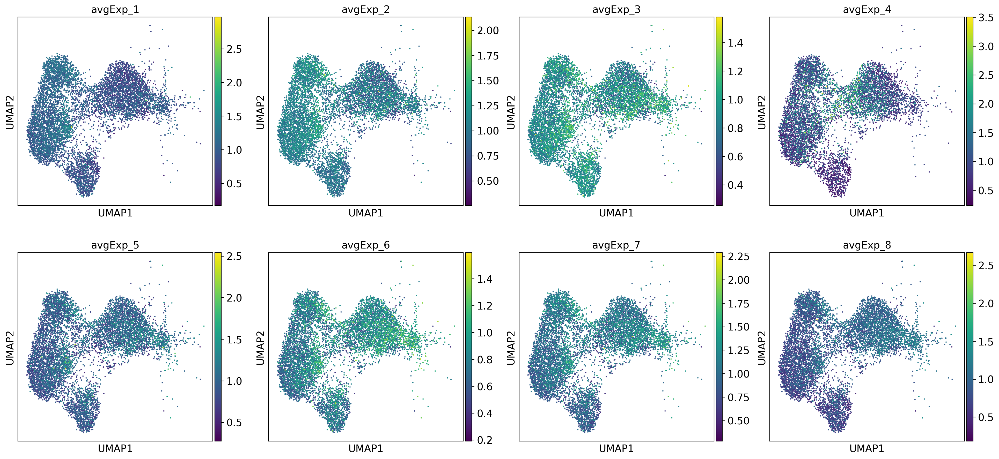

Sum Expression


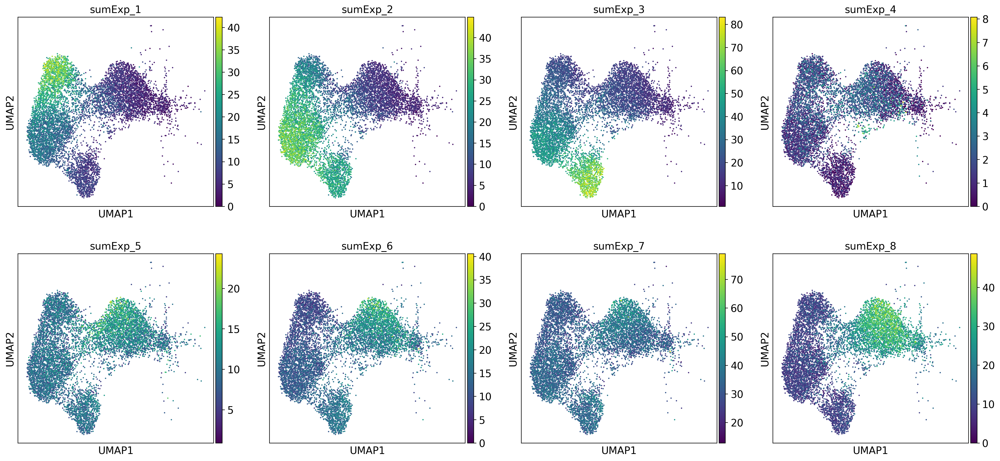

In [13]:
kirita_lists = kirita.groupby("cluster")["gene"].apply(list) # get list of markers for cluster1: kirita_lists[1]
for l, liste in enumerate(kirita_lists,1):
    tmp = []
    for gen in kirita_lists[l]:
        if  gen in adata_pt.var_names:          
            tmp.append(gen)
    kirita_lists[l] = tmp
    del(tmp)
    adata_pt.obs["sumExp_"+str(l)] = 0
    index_list = adata_pt[:, kirita_lists[l]].obs.index
    adata_pt.obs.loc[adata_pt.obs.index.isin(index_list), "sumExp_"+str(l)] = adata_pt[:, kirita_lists[l]].X.sum(axis=1)
    adata_pt.obs["countExp_"+str(l)] = 0
    adata_pt.obs.loc[adata_pt.obs.index.isin(index_list), "countExp_"+str(l)] = (adata_pt[:, kirita_lists[l]].X != 0).sum(axis=1)
    adata_pt.obs["avgExp_"+str(l)] = adata_pt.obs["sumExp_"+str(l)]/adata_pt.obs["countExp_"+str(l)]
    
print("avg Expression")
sc.pl.umap(adata_pt, color=['avgExp_1','avgExp_2', 'avgExp_3', 'avgExp_4', 'avgExp_5', 'avgExp_6', 
                            'avgExp_7', 'avgExp_8'])
print("Sum Expression")
sc.pl.umap(adata_pt, color=['sumExp_1', 'sumExp_2', 'sumExp_3','sumExp_4', 'sumExp_5', 'sumExp_6', 
                            'sumExp_7','sumExp_8'])   

# merge clusters

In [14]:
old_to_new = dict(                   
                healthy_S1= "Healthy_S1",
                healthy_S2="Healthy_S2",
                healthy_S3="Healthy_S3",
                failed_repair1="Failed_repair",
                failed_repair2="Failed_repair", 
                healthy_S2a="Healthy_S2",
                failed_repair5="Failed_repair",
                failed_repair6="Failed_repair",
                healthy_S2b="Healthy_S2", 
                injured_S12="Injured_S1/2",
                healthy_S1a="Healthy_S1",
                healthy_S2c="Healthy_S2",
                failed_repair3="Failed_repair", 
                failed_repair4="Failed_repair"
)

adata_pt.obs['paper_celltypes_merged'] = (
    adata_pt.obs['paper_celltypes']
    .map(old_to_new)
    .astype('category')
)

In [15]:
celltypes = ['Failed_repair', 'Healthy_S1', 'Healthy_S2', 'Healthy_S3',"Severe_injured", "Injured_S1/2"]
colors=     ['#4334eb',       '#43eb34',    '#279e68',    '#072e03',      "#3271a8" , '#cc0000']

colors = dict(zip(celltypes, colors))
adata_pt.uns["paper_celltypes_merged_colors"] = [colors[c] for c in adata_pt.obs.paper_celltypes_merged.cat.categories]

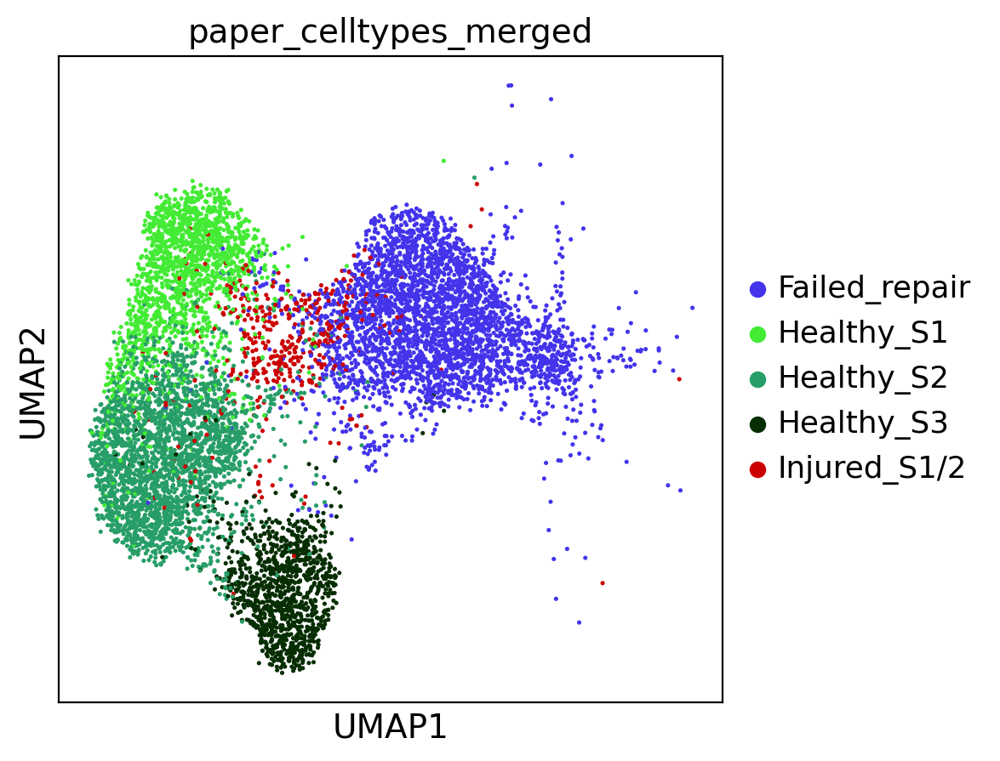

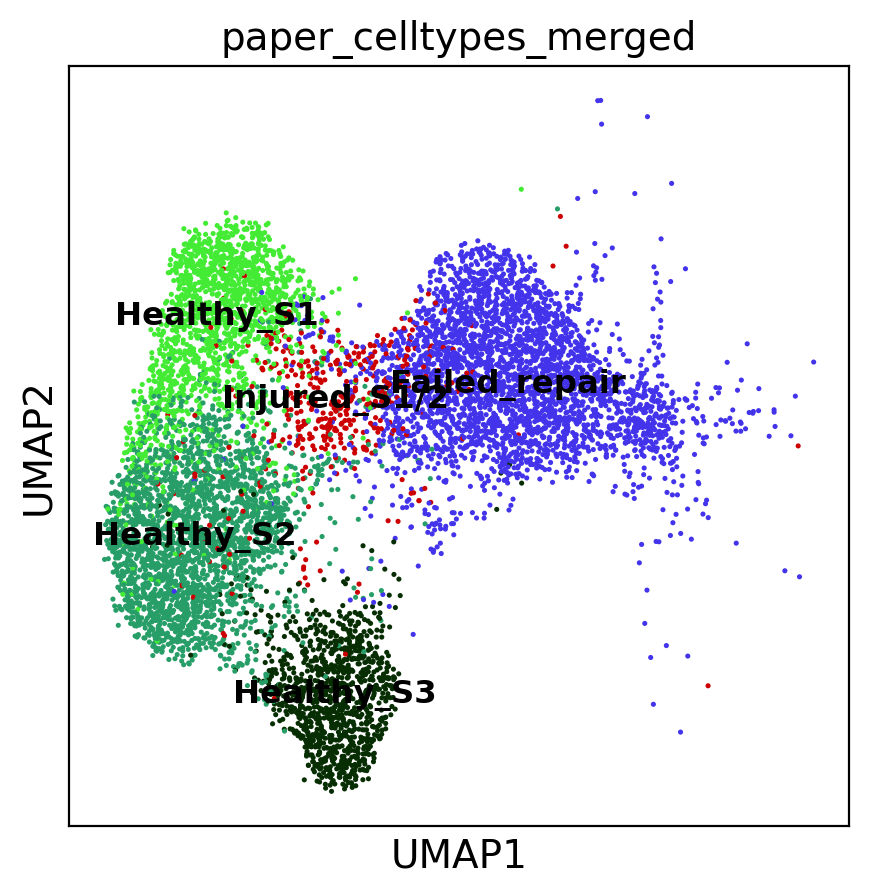

In [16]:
sc.pl.umap(adata_pt, color="paper_celltypes_merged")#, save="_sn_pt_celltypes")
sc.pl.umap(adata_pt, color="paper_celltypes_merged", legend_loc="on data", legend_fontsize="small")

Numbers of cells per celltype:
others (smaller groups): 
Empty DataFrame
Columns: [paper_celltypes_merged, sample]
Index: []
                       paper_celltypes_merged  cells       %
paper_celltypes_merged                                      
Failed_repair                   Failed_repair   3289  37.15%
Healthy_S1                         Healthy_S1   1566  17.69%
Healthy_S2                         Healthy_S2   2503  28.27%
Healthy_S3                         Healthy_S3   1068  12.06%
Injured_S1/2                     Injured_S1/2    427   4.82%


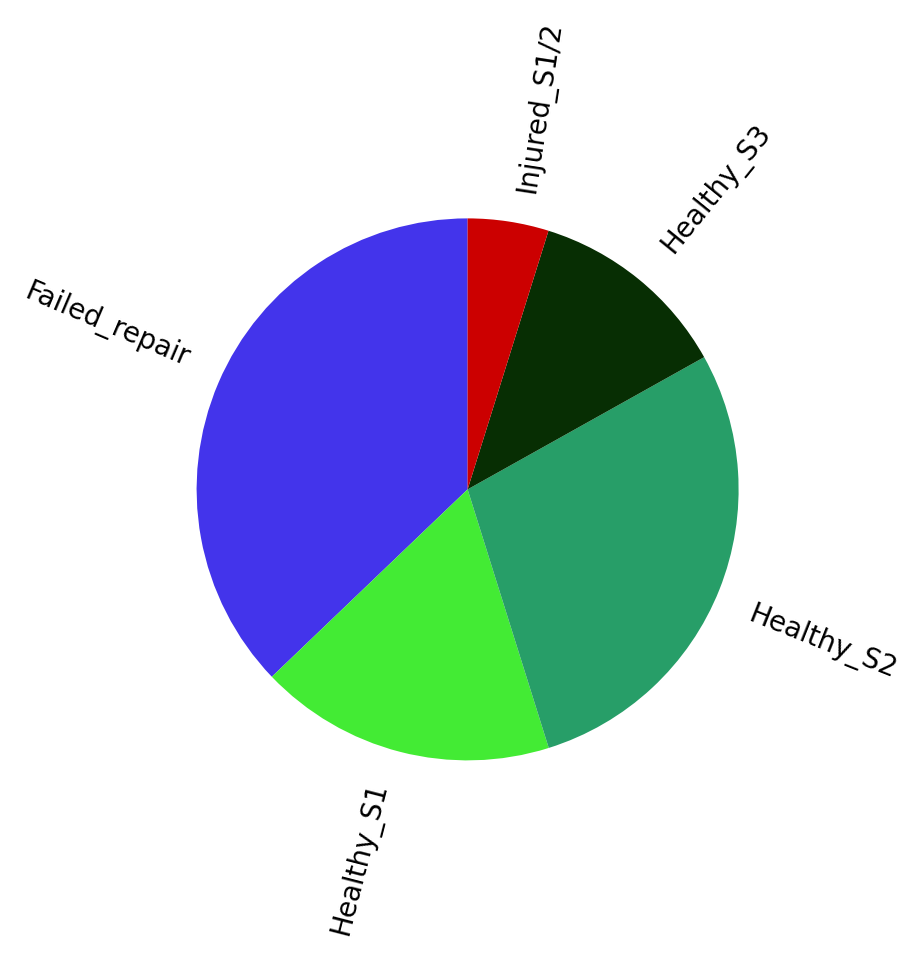

In [17]:
#rcParams['figure.figsize'] = 8,8
print("Numbers of cells per celltype:")
counts = adata_pt.obs.groupby(["paper_celltypes_merged"]).count()["sample"].reset_index()
counts = counts.sort_values("paper_celltypes_merged")
print("others (smaller groups): ")
print(counts[(counts['sample'] < 5)])
counts.columns = ["paper_celltypes_merged","cells"]
counts.index = counts.paper_celltypes_merged
counts['%'] = ((counts['cells'] / counts['cells'].sum())*100).round(2).astype(str) + '%'
print(counts)

fig1, ax1 = plt.subplots()
ax1.pie(counts["cells"], labels=counts["paper_celltypes_merged"],rotatelabels=45, 
         startangle=90,  textprops={'fontsize': 10}, colors=[colors[d] for d in counts["paper_celltypes_merged"]])
ax1.axis('equal') 
#plt.savefig( config['PATHS']["OUTPUT"]+"/figs/sn_pt_piechart.pdf",facecolor = 'white', dpi=600, bbox_inches='tight')
plt.tight_layout()
plt.show()

# UMAP colored by gene expressions

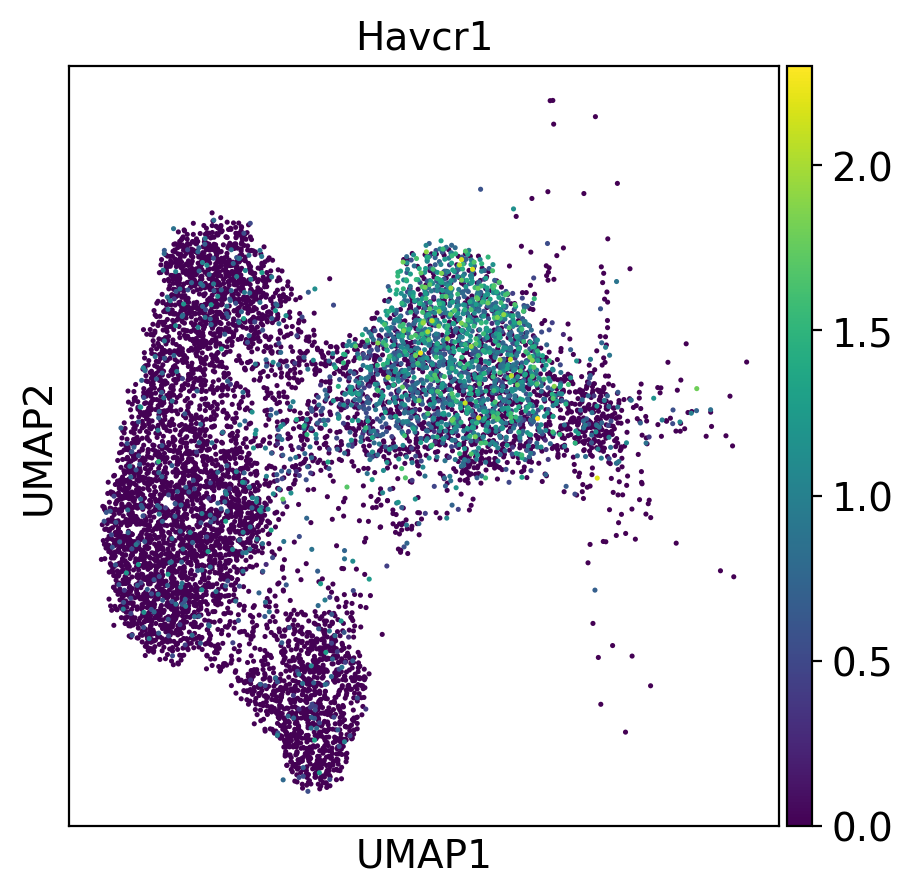

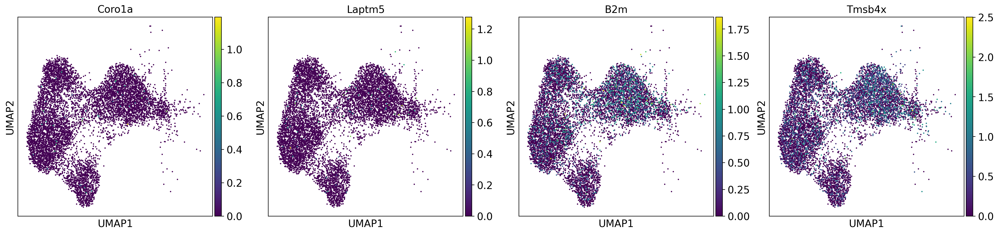

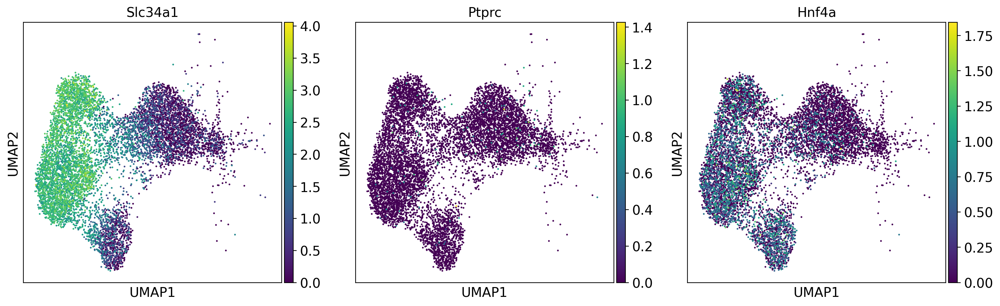

In [18]:
sc.pl.umap(adata_pt, color=["Havcr1"])#, save="_sn_pt_havcr1.pdf")
sc.pl.umap(adata_pt, color=['Coro1a', "Laptm5", "B2m","Tmsb4x"])
sc.pl.umap(adata_pt, color=["Slc34a1","Ptprc", "Hnf4a"])

In [19]:
#adata_pt.write(config['PATHS']["OUTPUT"]+"/sn_pt_annotated.h5ad")

# Transkript-level


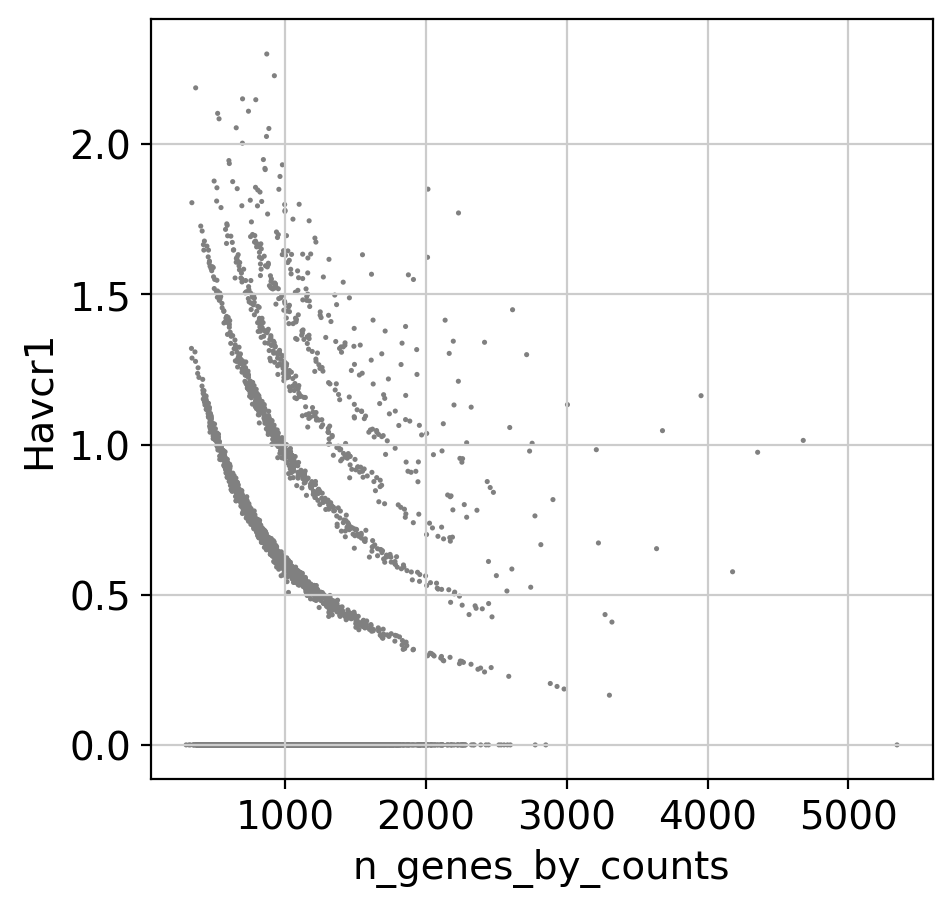

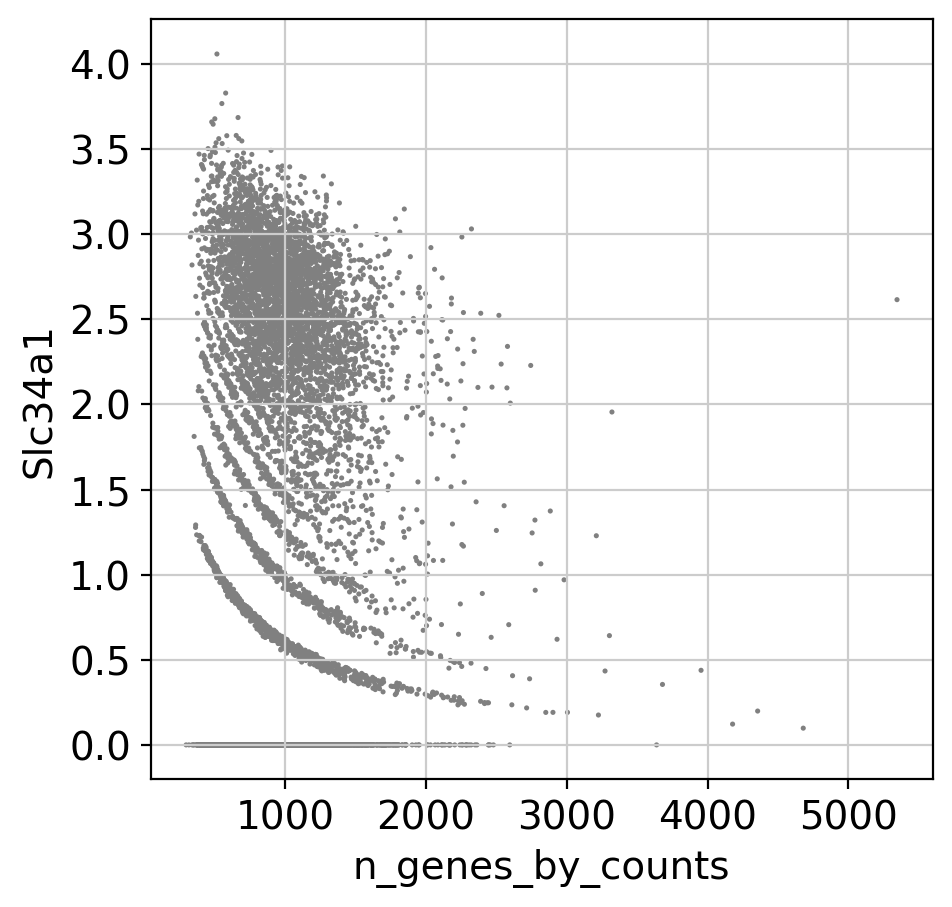

In [20]:
sc.pl.scatter(adata_pt, y="Havcr1", x="n_genes_by_counts")
sc.pl.scatter(adata_pt, y="Slc34a1", x="n_genes_by_counts")

In [21]:
sc.pp.calculate_qc_metrics(adata_pt, inplace=False, use_raw=True)[1].loc[["Havcr1","Slc34a1"]]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Havcr1,2217,0.228634,0.205903,74.957641,2024.102051,7.613375
Slc34a1,6484,1.501575,0.916921,26.759291,13293.444336,9.495102


In [22]:
np.mean(adata_pt.obs.total_counts)

1793.9287

In [23]:
np.mean(adata_pt.obs.n_genes_by_counts)

981.1104710267706

Number of expressed Genes in PT:

In [24]:
print(adata_pt)
sum(sc.pp.filter_genes(adata_pt, inplace=False, min_cells=1)[0])

AnnData object with n_obs × n_vars = 8853 × 19271
    obs: 'sample', 'sample_description', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'percent_mito', 'predicted_doublets', 'doublet_scores', 'louvain', 'n_counts_log', 'celltype', 'paper_celltypes', 'sumExp_1', 'countExp_1', 'avgExp_1', 'sumExp_2', 'countExp_2', 'avgExp_2', 'sumExp_3', 'countExp_3', 'avgExp_3', 'sumExp_4', 'countExp_4', 'avgExp_4', 'sumExp_5', 'countExp_5', 'avgExp_5', 'sumExp_6', 'countExp_6', 'avgExp_6', 'sumExp_7', 'countExp_7', 'avgExp_7', 'sumExp_8', 'countExp_8', 'avgExp_8', 'paper_celltypes_merged'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 

18773

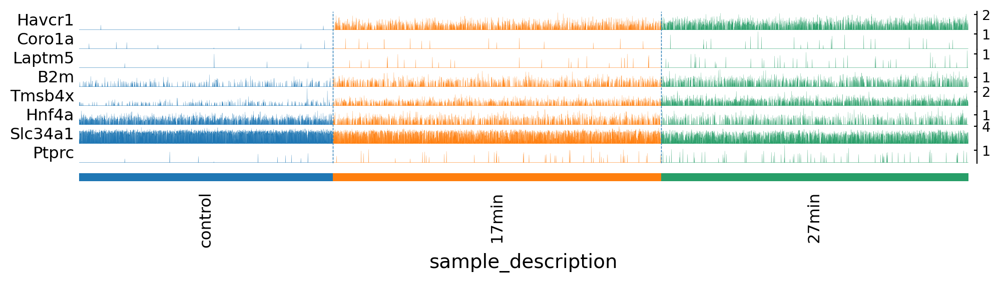

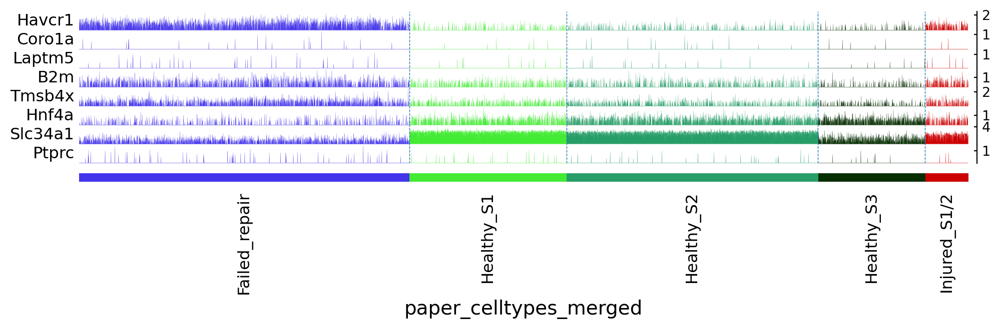

In [25]:
marker_genes= ['Havcr1','Coro1a', "Laptm5", "B2m","Tmsb4x","Hnf4a","Slc34a1","Ptprc"]
sc.pl.tracksplot(adata_pt, marker_genes, groupby='sample_description', dendrogram=False,
                 use_raw =True)#, save="_sn_pt_persample.png")
sc.pl.tracksplot(adata_pt, marker_genes, groupby='paper_celltypes_merged', dendrogram=False,
                 use_raw =True)#,save="_sn_pt_percelltype.png")

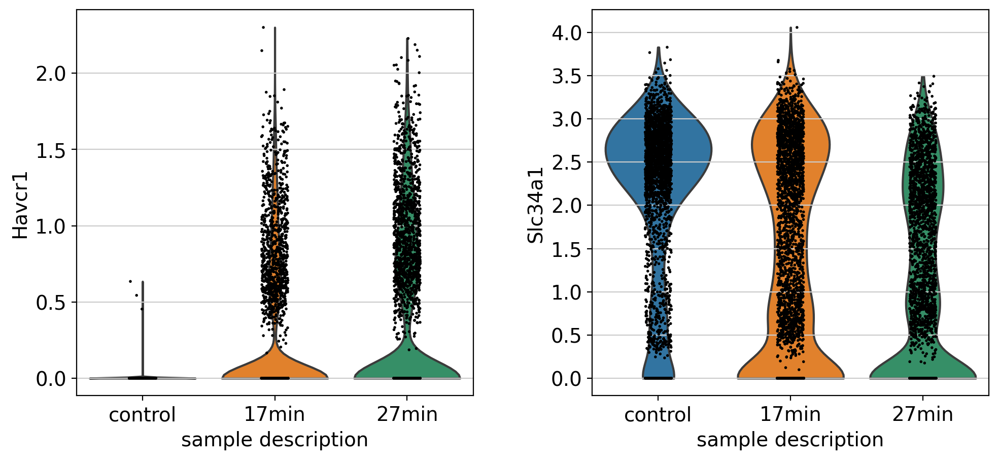

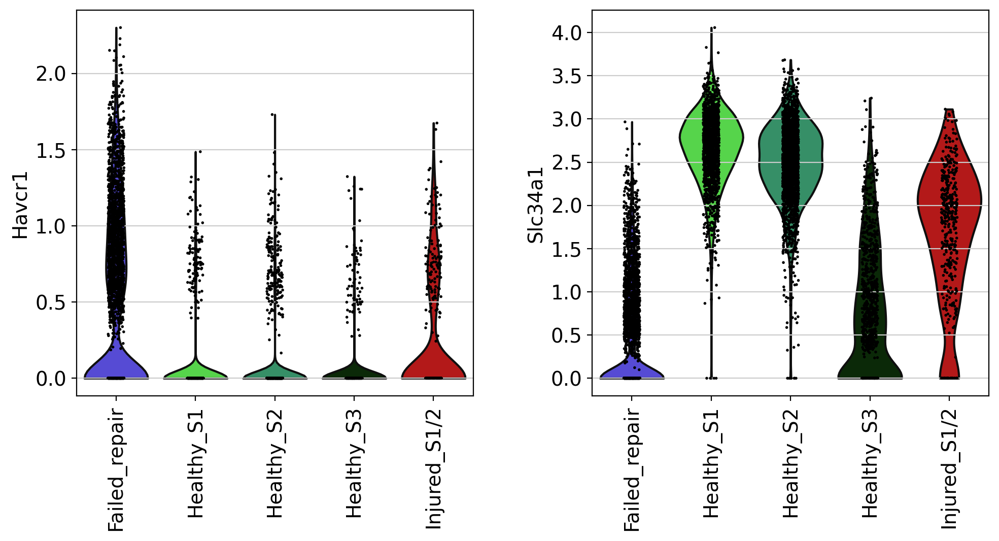

In [26]:
sc.pl.violin(adata_pt, ['Havcr1',"Slc34a1"], groupby='sample_description', size=2,
             use_raw =True)#, save="_sn_pt_sample.png")
plt.ylim=(0, 5)
sc.pl.violin(adata_pt, ['Havcr1',"Slc34a1"], groupby='paper_celltypes_merged',size=2,rotation =90, 
             use_raw =True)#, save="_sn_pt_celltype.png" )

## get raw count data

In [27]:
filenames = [
    config['PATHS']["DATA"]+"/N1535_N1541/outs/filtered_feature_bc_matrix/",
    config['PATHS']["DATA"]+"/N1536_N1542/outs/filtered_feature_bc_matrix/",
    config['PATHS']["DATA"]+"/N1537_N1543/outs/filtered_feature_bc_matrix/"]
sample_string = [ "N1535_N1541", "N1536_N1542", "N1537_N1543"]
sample_description= [ "nuclei_control", "nuclei_17min", "nuclei_27min"]
sample_id = ["0","1","2"]

#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["sample_description"] =  [sample_description[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
print(adata)

#read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["sample_description"] =  [sample_description[index]]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

AnnData object with n_obs × n_vars = 7905 × 31053
    obs: 'sample', 'sample_description', 'batch'
    var: 'gene_ids', 'feature_types'
1 /mnt/dzl_bioinf/deluca/kidney/N1536_N1542/outs/filtered_feature_bc_matrix/
2 /mnt/dzl_bioinf/deluca/kidney/N1537_N1543/outs/filtered_feature_bc_matrix/


In [28]:
adata[adata.obs.index.isin(adata_pt.obs.index),:]

View of AnnData object with n_obs × n_vars = 8853 × 31053
    obs: 'sample', 'sample_description', 'batch'
    var: 'gene_ids', 'feature_types'

In [29]:
sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[1].loc[["Havcr1","Slc34a1"]]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Havcr1,2217,0.493279,0.400974,74.957641,4367.0,8.382060
Slc34a1,6484,8.288715,2.228800,26.759291,73380.0,11.203421


In [30]:
df =sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[1].sort_values("mean_counts",  ascending=False)#.loc[["Havcr1","Slc34a1"]]
df = df[df.mean_counts > 0]
df

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Malat1,8853,483.451813,6.183018,0.000000,4279999.0,15.269464
Neat1,8744,13.312324,2.661121,1.231221,117854.0,11.677210
Kap,8708,10.006664,2.398501,1.637863,88589.0,11.391774
Slc34a1,6484,8.288715,2.228800,26.759291,73380.0,11.203421
mt-Co3,8380,6.904552,2.067439,5.342822,61126.0,11.020709
...,...,...,...,...,...,...
Ift88os,1,0.000113,0.000113,99.988704,1.0,0.693147
Olfr907,1,0.000113,0.000113,99.988704,1.0,0.693147
Olfr149,1,0.000113,0.000113,99.988704,1.0,0.693147
Olfr961,1,0.000113,0.000113,99.988704,1.0,0.693147


In [31]:
df[df.mean_counts > 13]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Malat1,8853,483.451813,6.183018,0.000000,4279999.0,15.269464
Neat1,8744,13.312324,2.661121,1.231221,117854.0,11.677210


In [32]:
print(" mean Counts per Cell: "+str(np.mean(sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[0]["total_counts"])))

 mean Counts per Cell: 1793.9287


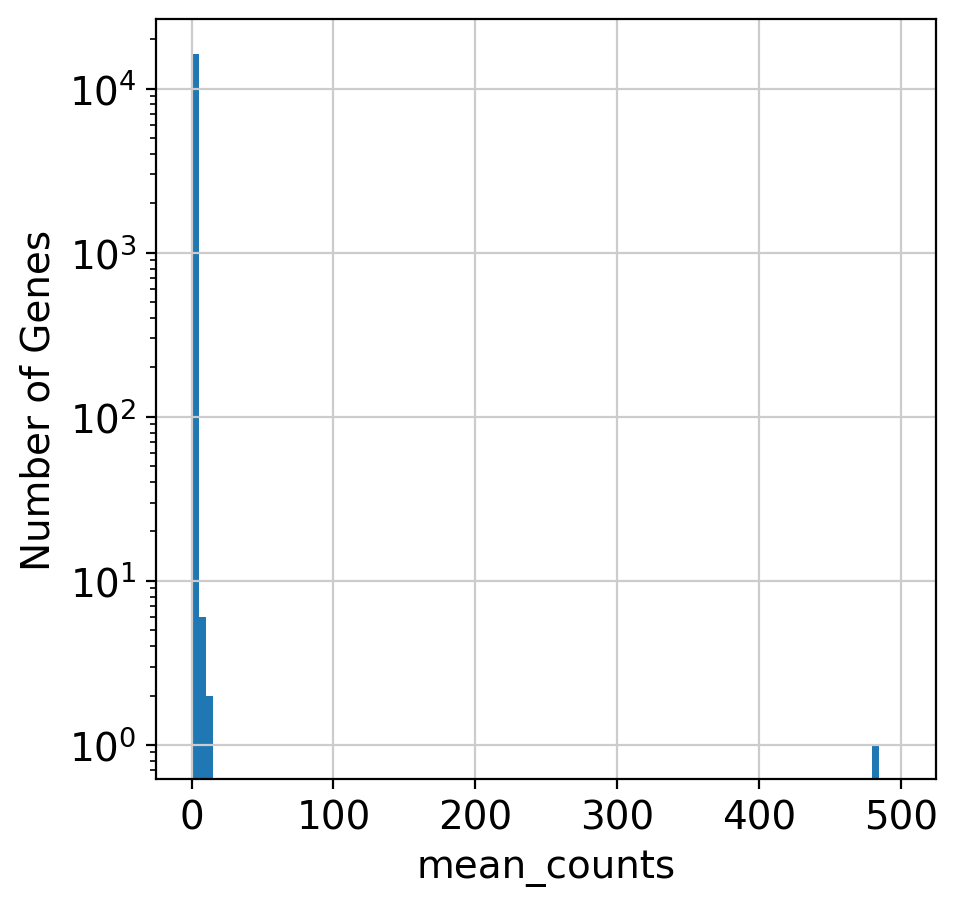

In [33]:
plt.hist(df[df.total_counts >= 5]["mean_counts"], bins=100,  range=(0, 500))
plt.yscale('log')
plt.ylabel("Number of Genes")
plt.xlabel("mean_counts")
plt.show()

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_description' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical


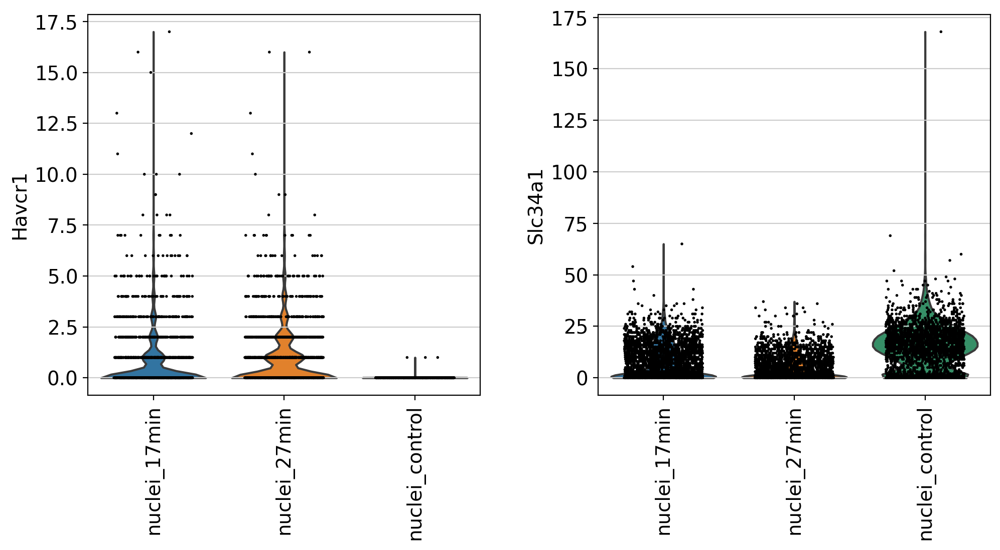

In [34]:
sc.pl.violin(adata[adata.obs.index.isin(adata_pt.obs.index),:], ['Havcr1',"Slc34a1"],
             groupby='sample_description', size=2, stripplot=True, jitter=0.3, rotation=90)

# Save Notebook as html

In [35]:
sc.logging.print_versions()

-----
anndata     0.7.4
scanpy      1.5.1
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
anyio               NA
attr                21.2.0
babel               2.9.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
cairo               1.19.1
certifi             2020.06.20
cffi                1.14.2
chardet             3.0.4
cloudpickle         1.2.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2.10.1
dateutil            2.8.1
decorator           4.4.2
defusedxml          0.6.0
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.8.2
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              1.1.0
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterla

In [36]:
%%bash
jupyter nbconvert --to html_toc script_sn_20211103_kirita_5mt.ipynb --ExtractOutputPreprocessor.enabled=False
#mv script_sn_20210204_kirita.html ./results/script_sn_20210204_kirita.html 

[NbConvertApp] Converting notebook script_sn_20211103_kirita_5mt.ipynb to html_toc
[NbConvertApp] Writing 19380100 bytes to script_sn_20211103_kirita_5mt.html
